In [1]:
import h5py
import matplotlib.pyplot as plt
import numpy as np
from skimage import draw
from skimage import measure
from skimage import io
from shapely.geometry import Polygon, MultiPolygon
from collections import namedtuple
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import Visualizer
import os
import pickle
import tarfile

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
h5 = h5py.File("/Users/alexustian/synth_text_results/SynthTextFull.h5")
h5["data"].keys()

<KeysViewHDF5 ['ant+hill_10.jpg_0', 'ant+hill_10.jpg_0_mask', 'ant+hill_100.png_0', 'ant+hill_100.png_0_mask', 'ant+hill_102.jpg_0', 'ant+hill_102.jpg_0_mask', 'ant+hill_106.jpg_0', 'ant+hill_106.jpg_0_mask', 'ant+hill_110.jpg_0', 'ant+hill_110.jpg_0_mask', 'ant+hill_111.jpg_0', 'ant+hill_111.jpg_0_mask', 'ant+hill_113.jpg_0', 'ant+hill_113.jpg_0_mask', 'ant+hill_114.jpg_0', 'ant+hill_114.jpg_0_mask', 'ant+hill_115.jpg_0', 'ant+hill_115.jpg_0_mask', 'ant+hill_116.jpg_0', 'ant+hill_116.jpg_0_mask', 'ant+hill_12.jpg_0', 'ant+hill_12.jpg_0_mask', 'ant+hill_122.jpg_0', 'ant+hill_122.jpg_0_mask', 'ant+hill_124.jpg_0', 'ant+hill_124.jpg_0_mask', 'ant+hill_126.jpg_0', 'ant+hill_126.jpg_0_mask', 'ant+hill_127.jpg_0', 'ant+hill_127.jpg_0_mask', 'ant+hill_129.jpg_0', 'ant+hill_129.jpg_0_mask', 'ant+hill_13.jpg_0', 'ant+hill_13.jpg_0_mask', 'ant+hill_131.jpg_0', 'ant+hill_131.jpg_0_mask', 'ant+hill_133.jpg_0', 'ant+hill_133.jpg_0_mask', 'ant+hill_135.jpg_0', 'ant+hill_135.jpg_0_mask', 'ant+hill_1

In [4]:
h5["data"]["hiking_125.jpg_0"].attrs.keys()

<KeysViewHDF5 ['charBB', 'txt', 'wordBB']>

In [5]:
h5["data"]["hiking_125.jpg_0"].attrs["txt"]

array([' faster \n(MILLER,', 'his', '> Of course', 'of these tools is',
       'may', 'Some had', 'and'], dtype=object)

In [6]:
chars = ''.join(list(h5["data"]["hiking_125.jpg_0"].attrs["txt"])).replace(' ','').replace('\n','')
chars

'faster(MILLER,his>OfcourseofthesetoolsismaySomehadand'

In [7]:
h5["data"]["hiking_125.jpg_0"].attrs["charBB"][:,:,0]

array([[39.5795202 , 53.66658399, 53.1802764 , 39.09691683],
       [57.98496267, 59.98574335, 77.09629492, 75.10584175]])

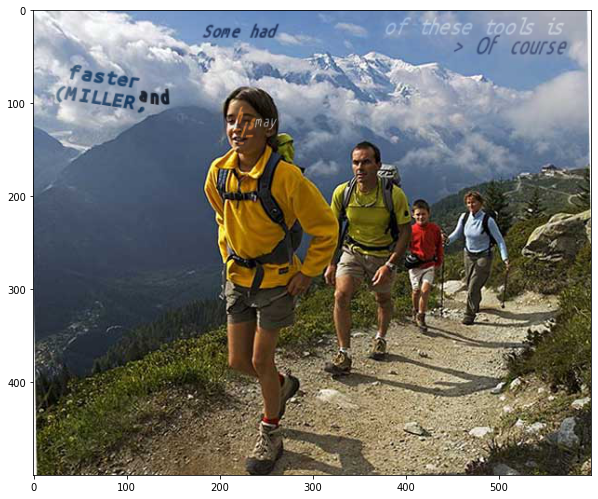

In [8]:
plt.figure(figsize=(10,10))
plt.imshow(h5["data"]["hiking_125.jpg_0"][:])

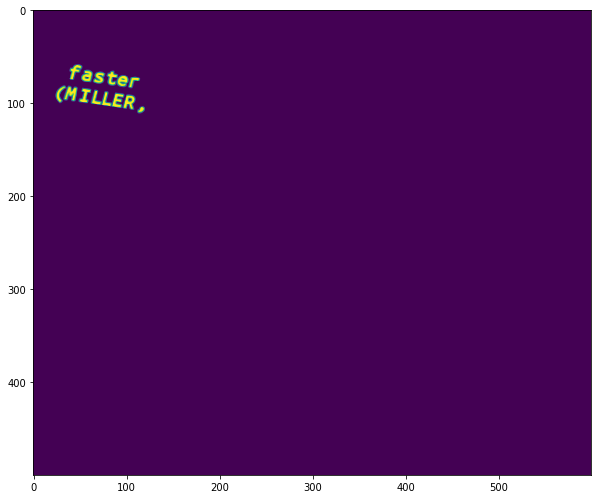

In [9]:
plt.figure(figsize=(10,10))
plt.imshow(h5["data"]["hiking_125.jpg_0_mask"][0,:,:])

In [10]:
def plot_charBB(charBB, img):
    img_copy = np.copy(img)
    row_coords, column_coords = draw.polygon_perimeter(charBB[1,:], charBB[0,:])
    img_copy[row_coords, column_coords] = (0, 255, 0)
    plt.figure(figsize=(10,10))
    plt.imshow(img_copy)

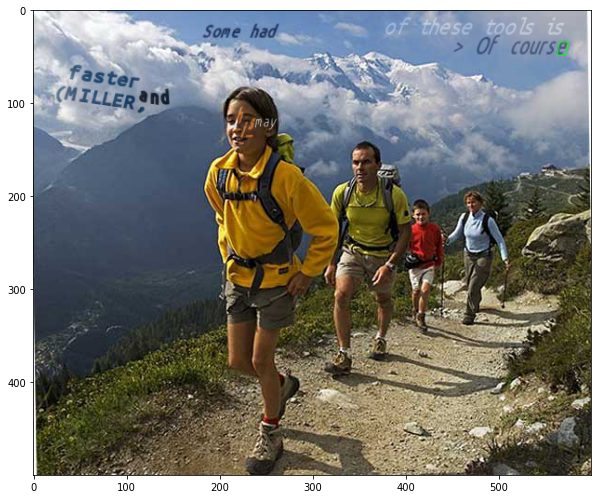

In [11]:
plot_charBB(h5["data"]["hiking_125.jpg_0"].attrs["charBB"][:,:,25], h5["data"]["hiking_125.jpg_0"][:])

* I need to assign a label to each pixel, I have a bounding box for a character, do I know what the character is?
* I loop over the characters that are not white space or newlines and I loop over the bounding boxes, these should match up
    * It seems like they do
* Make a dict for the classes, put everything as 0 (background) and then loop through the bounding boxes and intersect with the text mask, mark the activated pixels in there as the corresponding character

In [12]:
h5["data"]["hiking_125.jpg_0_mask"].shape

(7, 500, 600)

In [4]:
def make_mask_img(mask_tensor):
    mask_img = np.zeros(mask_tensor.shape[1:])
    for i in range(mask_tensor.shape[0]):
        mask_img += mask_tensor[i,:,:]
    return mask_img

In [14]:
mask_img = make_mask_img(h5["data"]["hiking_125.jpg_0_mask"])

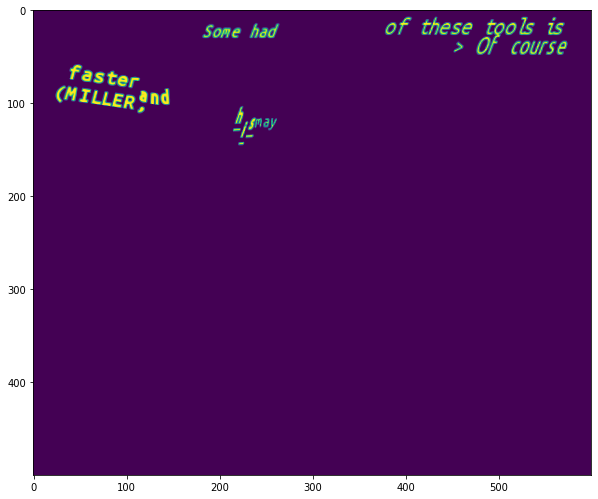

In [15]:
plt.figure(figsize=(10,10))
plt.imshow(mask_img)

In [5]:
CHARS = """abcdefghijklmnopqrstuvwxyzABCDEFGHIJKLMNOPQRSTUVWXYZ1234567890!@#$%^&*(),<.>/?;:-=+'\"[]|`~_"""
CHAR_TO_CODE = dict(zip(CHARS, range(1, len(CHARS)+1)))
CHAR_TO_CODE

{'a': 1,
 'b': 2,
 'c': 3,
 'd': 4,
 'e': 5,
 'f': 6,
 'g': 7,
 'h': 8,
 'i': 9,
 'j': 10,
 'k': 11,
 'l': 12,
 'm': 13,
 'n': 14,
 'o': 15,
 'p': 16,
 'q': 17,
 'r': 18,
 's': 19,
 't': 20,
 'u': 21,
 'v': 22,
 'w': 23,
 'x': 24,
 'y': 25,
 'z': 26,
 'A': 27,
 'B': 28,
 'C': 29,
 'D': 30,
 'E': 31,
 'F': 32,
 'G': 33,
 'H': 34,
 'I': 35,
 'J': 36,
 'K': 37,
 'L': 38,
 'M': 39,
 'N': 40,
 'O': 41,
 'P': 42,
 'Q': 43,
 'R': 44,
 'S': 45,
 'T': 46,
 'U': 47,
 'V': 48,
 'W': 49,
 'X': 50,
 'Y': 51,
 'Z': 52,
 '1': 53,
 '2': 54,
 '3': 55,
 '4': 56,
 '5': 57,
 '6': 58,
 '7': 59,
 '8': 60,
 '9': 61,
 '0': 62,
 '!': 63,
 '@': 64,
 '#': 65,
 '$': 66,
 '%': 67,
 '^': 68,
 '&': 69,
 '*': 70,
 '(': 71,
 ')': 72,
 ',': 73,
 '<': 74,
 '.': 75,
 '>': 76,
 '/': 77,
 '?': 78,
 ';': 79,
 ':': 80,
 '-': 81,
 '=': 82,
 '+': 83,
 "'": 84,
 '"': 85,
 '[': 86,
 ']': 87,
 '|': 88,
 '`': 89,
 '~': 90,
 '_': 91}

In [17]:
def add_channel_info(charBB_tensor, mask_img, img_text):
    # convert text to string
    img_text_str = ''.join(list(img_text)).replace(' ','').replace('\n','')
    channel_tensor = np.zeros((mask_img.shape[0], mask_img.shape[1], len(CHAR_TO_CODE.keys())+1))
    active_text_pixels = set([tuple(x) for x in np.argwhere(mask_img > 150)])
    for i in range(charBB_tensor.shape[2]):
        charBB = charBB_tensor[:,:,i]
        charBB_indices = set(list(zip(*[list(coords) for coords in draw.polygon(charBB[1,:], charBB[0,:])])))
        active_char_pixels = active_text_pixels & charBB_indices 
        char_code = CHAR_TO_CODE[img_text_str[i]]
        for pixel in active_char_pixels:
            channel_tensor[pixel[0], pixel[1], char_code] = 1
            # do we put the "color" of the pixel as the char_code? Or binary encoding into the "color" channel?
            # I think the latter?
    return channel_tensor

In [18]:
channel_img = add_channel_info(
    h5["data"]["hiking_125.jpg_0"].attrs["charBB"], 
    mask_img, 
    h5["data"]["hiking_125.jpg_0"].attrs["txt"]
)

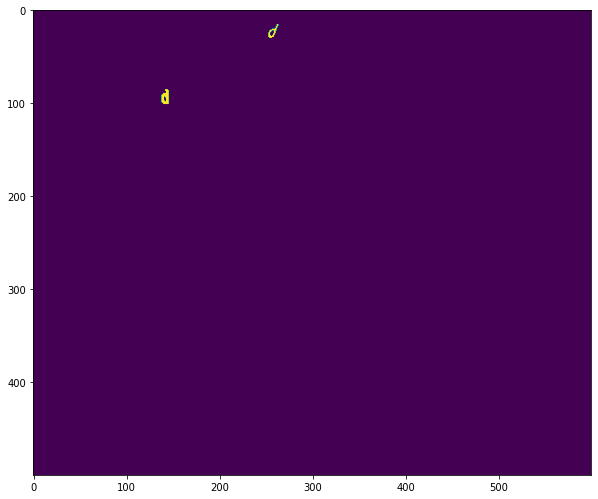

In [19]:
plt.figure(figsize=(10,10))
plt.imshow(channel_img[:,:,4])

# Detectron2 format
* I need the bounding box, contour polygon, and category id
* When I have the individual active character pixels isolated, I want to get the contour
* For skimage's find_contour, I want to put in a binary image with the character to be contoured

In [6]:
SegmentInfo = namedtuple("SegmentInfo", ["segmentations", "bbox"])
def convert_contours_to_segment_info(contours):
    segmentations = []
    polygons = []
    for contour in contours:
        # Flip from (row, col) representation to (x, y)
        # and subtract the padding pixel
        for i in range(len(contour)):
            row, col = contour[i]
            contour[i] = (col - 1, row - 1)

        # Make a polygon and simplify it
        poly = Polygon(contour)
        poly = poly.simplify(1.0, preserve_topology=False)
        polygons.append(poly)
        segmentation = np.array(poly.exterior.coords).ravel().tolist()
        if not segmentation: # why are these empty sometimes?
            continue
        segmentations.append(segmentation)

    # Combine the polygons to calculate the bounding box and area
    multi_poly = MultiPolygon(polygons)
    if not segmentations or len(multi_poly) == 0:
        return None

    x, y, max_x, max_y = multi_poly.bounds
    width = max_x - x
    height = max_y - y
    bbox = (x, y, width, height)
    
    return SegmentInfo(segmentations, bbox)

In [7]:
ACTIVE_THRESHOLD = 100
def convert_mask_to_detectron(charBB_tensor, mask_img, img_text, image_id, file_name):
    img_text_str = ''.join(list(img_text)).replace(' ','').replace('\n','')
    individual_mask_img = np.zeros_like(mask_img)
    active_text_pixels = set([tuple(x) for x in np.argwhere(mask_img > ACTIVE_THRESHOLD)])
    annotations = []
    for i in range(charBB_tensor.shape[2]):
    
        # isolate the character pixels
        charBB = charBB_tensor[:,:,i]
        charBB_indices = set(list(zip(*[list(coords) for coords in draw.polygon(charBB[1,:], charBB[0,:])])))
        active_char_pixels = active_text_pixels & charBB_indices
        
        # create a "mask img" for them
        x_active, y_active = list(zip(*active_char_pixels))
        individual_mask_img[x_active, y_active] = 1 # fix this to be x,y slicing
        
        # get the segmentation polygons, bounding box, and area
        contours = measure.find_contours(individual_mask_img, 0.5, positive_orientation="low")
        segment_info = convert_contours_to_segment_info(contours)
        if segment_info is None:
            continue
        
        # get the category code
        char_code = CHAR_TO_CODE[img_text_str[i]]
        
        annotations.append({
            "category_id": char_code,
            "segmentation": segment_info.segmentations,
            "bbox": segment_info.bbox,
            "bbox_mode": BoxMode.XYWH_ABS
        })
        
        # reset the individual_mask_img
        individual_mask_img[x_active, y_active] = 0

    record = {
        "image_id": image_id,
        "height": mask_img.shape[0],
        "width": mask_img.shape[1],
        "file_name": file_name,
        "annotations": annotations
    }

    return record

In [18]:
detectron_dict = convert_mask_to_detectron(
    h5["data"]["ant+hill_10.jpg_0"].attrs["charBB"], 
    make_mask_img(h5["data"]["ant+hill_10.jpg_0_mask"]), 
    h5["data"]["ant+hill_10.jpg_0"].attrs["txt"],
    0,
    "/Users/alexustian/synth_text_results/images/ant+hill_10.jpg"
)

# Many images
* Save images of output of synth text h5 into "./images" folder
* Loop the convert to coco method over the images, feeding in the appropriate pieces from the h5 file
* I want to upload a pickle file of the list of detectron dicts and the images folder

In [130]:
def save_h5_images_to_folder():
    h5 = h5py.File("/Users/alexustian/synth_text_results/SynthTextFull.h5")
    image_and_mask_names = list(h5["data"].keys())
    image_names = [name for name in image_and_mask_names if not name.endswith("mask")]
    for name in image_names:
        clean_name = name.rstrip("_0")
        if clean_name.endswith("jpg") or clean_name.endswith("jpeg"):
            io.imsave(os.path.join("/Users/alexustian/synth_text_results/images", clean_name), h5["data"][name][:], quality=100)
        else:
            io.imsave(os.path.join("/Users/alexustian/synth_text_results/images", clean_name), h5["data"][name][:])
    h5.close()

In [131]:
save_h5_images_to_folder()

In [20]:
def get_detectron_dicts():
    h5 = h5py.File("/Users/alexustian/synth_text_results/SynthTextFull.h5")
    image_and_mask_names = list(h5["data"].keys())
    image_names = [name for name in image_and_mask_names if not name.endswith("mask")]
    output_dicts = []
    for i, image_name in enumerate(image_names):
        if i % 50 == 0:
            print(f"image {i}")
        mask_img = make_mask_img(h5["data"][image_name+"_mask"])
        file_name = os.path.join("images", image_name.rstrip("_0"))
        charBB_tensor = h5["data"][image_name].attrs["charBB"]
        img_text = h5["data"][image_name].attrs["txt"]
        try:
            output_dicts.append(
                convert_mask_to_detectron(charBB_tensor, mask_img, img_text, i, file_name)
            )
        except Exception as e:
            #import pdb; pdb.set_trace()
            #convert_mask_to_detectron(charBB_tensor, mask_img, img_text, i, file_name)
            print(e)
            continue
    h5.close()
    return output_dicts

In [21]:
detectron_dicts = get_detectron_dicts()

image 0
image 50
image 100
image 150
image 200
image 250
image 300
not enough values to unpack (expected 2, got 0)
not enough values to unpack (expected 2, got 0)
image 350
image 400
image 450
not enough values to unpack (expected 2, got 0)
not enough values to unpack (expected 2, got 0)
not enough values to unpack (expected 2, got 0)
image 500
not enough values to unpack (expected 2, got 0)
image 550
not enough values to unpack (expected 2, got 0)
not enough values to unpack (expected 2, got 0)
image 600
not enough values to unpack (expected 2, got 0)
image 650
not enough values to unpack (expected 2, got 0)
not enough values to unpack (expected 2, got 0)
image 700
not enough values to unpack (expected 2, got 0)
image 750
not enough values to unpack (expected 2, got 0)
image 800
'MultiPolygon' object has no attribute 'exterior'
not enough values to unpack (expected 2, got 0)
image 850
image 900
image 950


In [10]:
DatasetCatalog.register("synth_text", lambda: detectron_dicts)

In [11]:
MetadataCatalog.get("synth_text").set(
    thing_classes=["bg"]+list(CHAR_TO_CODE.keys()),
)
synth_text_metadata = MetadataCatalog.get("synth_text")

In [14]:
def get_image_from_dict(detectron_dict):
    return io.imread(detectron_dict["file_name"])

In [15]:
def get_mask_from_dict(detectron_dict):
    h5 = h5py.File("/Users/alexustian/synth_text_results/SynthTextFull.h5")
    mask_img = make_mask_img(h5["data"][detectron_dict["file_name"]+"_0_mask"])
    h5.close()
    return mask_img

In [16]:
def plot_detectron_img(detectron_dict):
    visualizer = Visualizer(get_image_from_dict(detectron_dict)[:, :, ::-1], metadata=synth_text_metadata, scale=1)
    out = visualizer.draw_dataset_dict(detectron_dict)
    plt.figure(figsize=(25,25))
    plt.imshow(out.get_image()[:, :, ::-1])

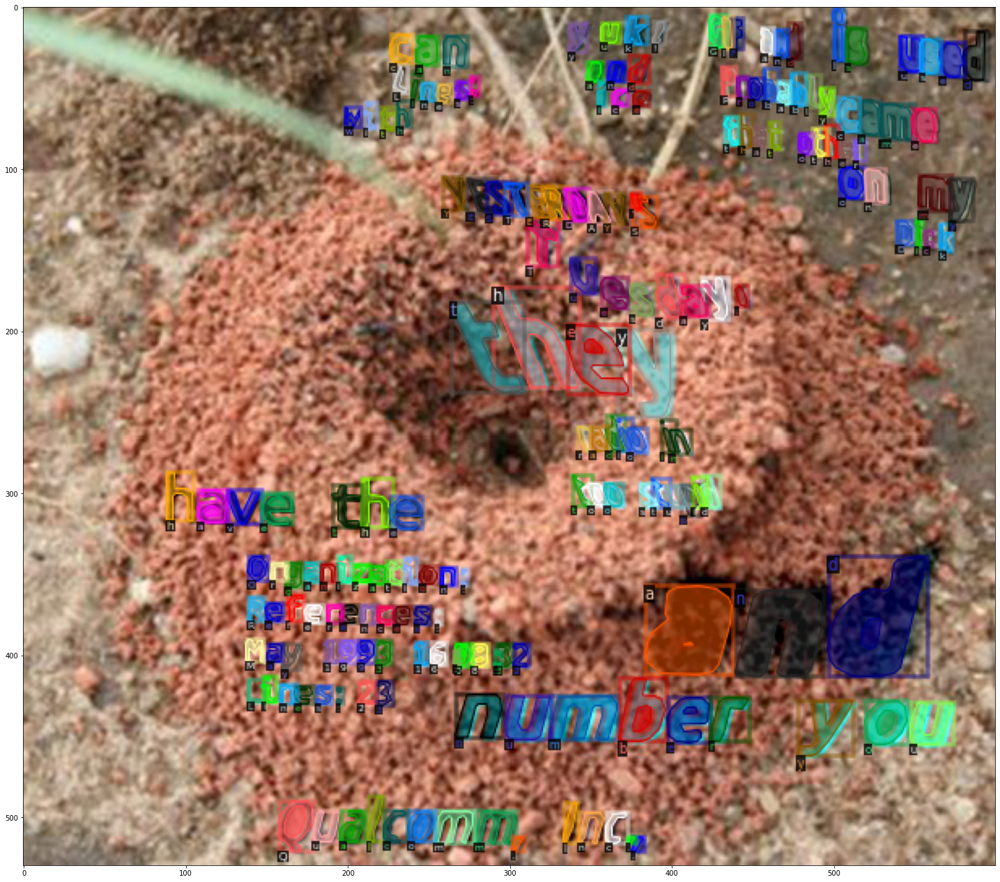

In [19]:
plot_detectron_img(detectron_dict)

# To send to Colab
* Need to get the detectron dicts dictionary pickled
* Need to get the images folder in results zipped or something

In [22]:
with open("/Users/alexustian/synth_text_results/detectron_dicts.pkl", "wb") as fh:
    pickle.dump(detectron_dicts, fh)

In [23]:
def archive_imgs():
    img_names = os.listdir("/Users/alexustian/synth_text_results/images")
    tar = tarfile.open("/Users/alexustian/synth_text_results/images.tar.gz", "w:gz")
    for name in img_names:
        tar.add(
            os.path.join("/Users/alexustian/synth_text_results/images", name),
            arcname=os.path.join("images", name)
        )
    tar.close()

In [24]:
archive_imgs()

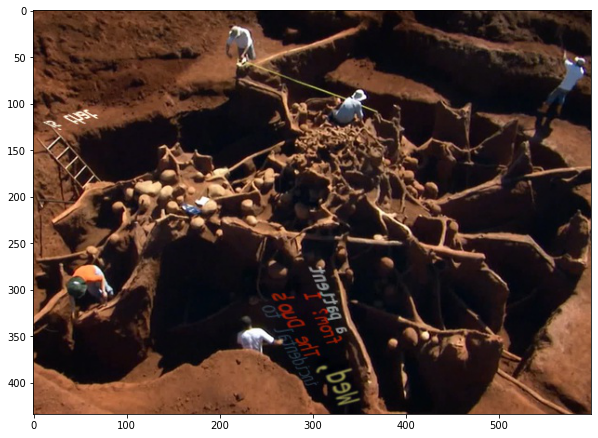

In [87]:
plt.figure(figsize=(10,10))
plt.imshow(get_image_from_dict(detectron_dicts[20]))

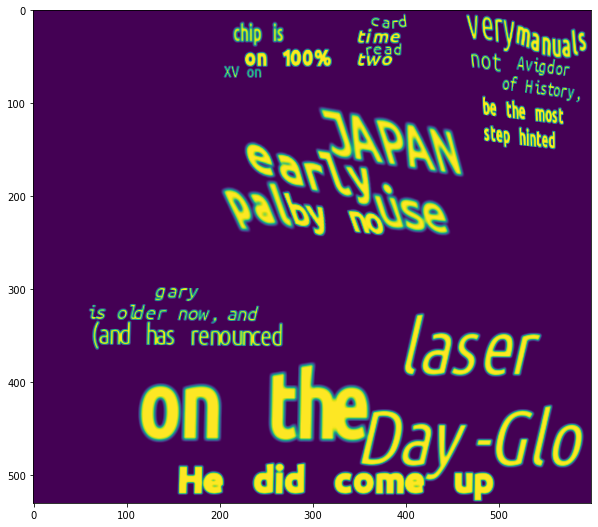

In [62]:
plt.figure(figsize=(10,10))
plt.imshow(get_mask_from_dict(detectron_dicts[1]))

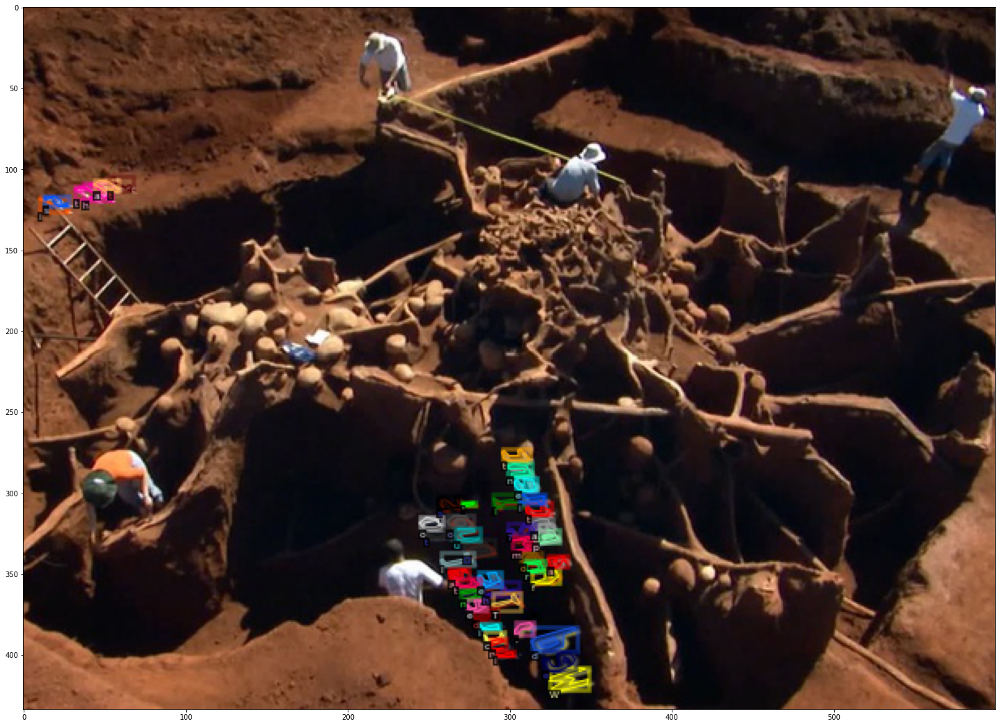

In [92]:
plot_detectron_img(detectron_dicts[20])

# Examples from larger dataset

In [138]:
h5 = h5py.File("SynthTextFull.h5")

FileNotFoundError: [Errno 2] Unable to open file (unable to open file: name = 'SynthTextFull.h5', errno = 2, error message = 'No such file or directory', flags = 0, o_flags = 0)

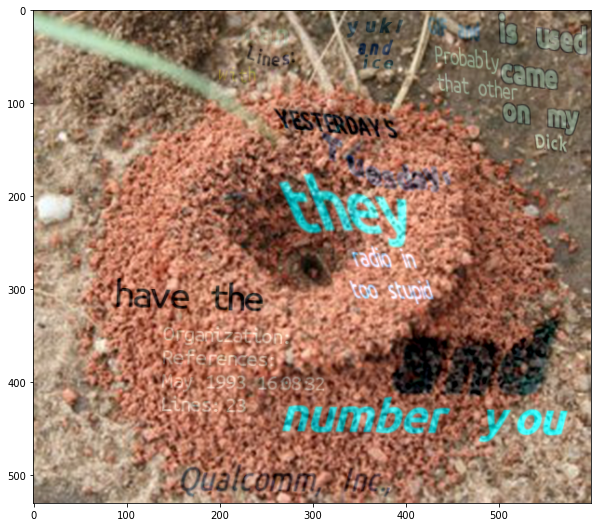

In [139]:
plt.figure(figsize=(10,10))
plt.imshow(h5["data"]["ant+hill_10.jpg_0"][:])

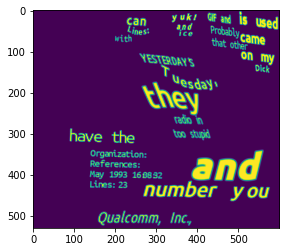

In [140]:
plt.imshow(make_mask_img(h5["data"]["ant+hill_10.jpg_0_mask"]))

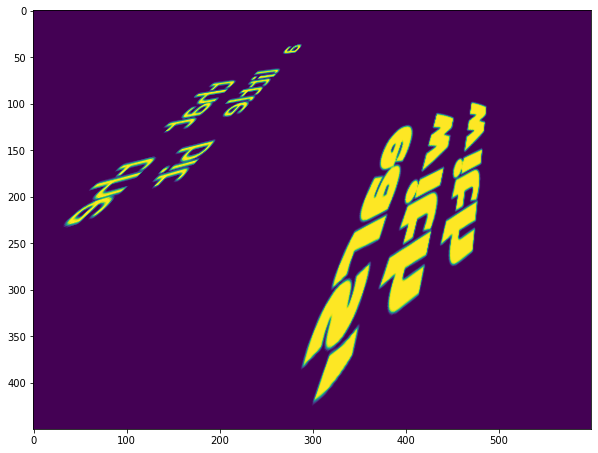

In [117]:
plt.figure(figsize=(10,10))
plt.imshow(make_mask_img(h5["data"]["ant+hill_1.jpg_0_mask"][:]))

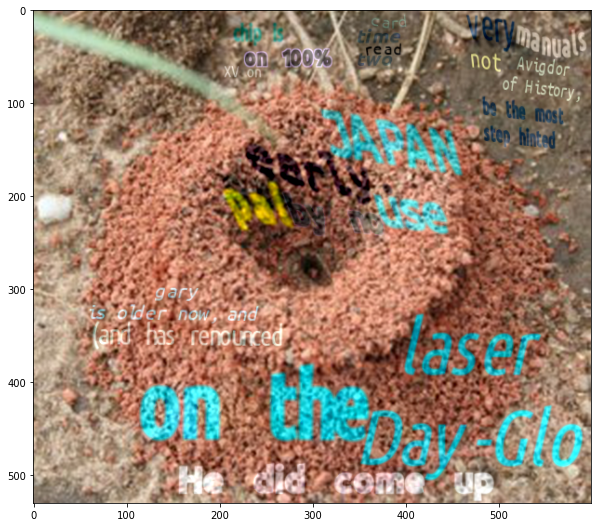

In [56]:
plt.figure(figsize=(10,10))
plt.imshow(h5["data"]["ant+hill_10.jpg_0"][:])

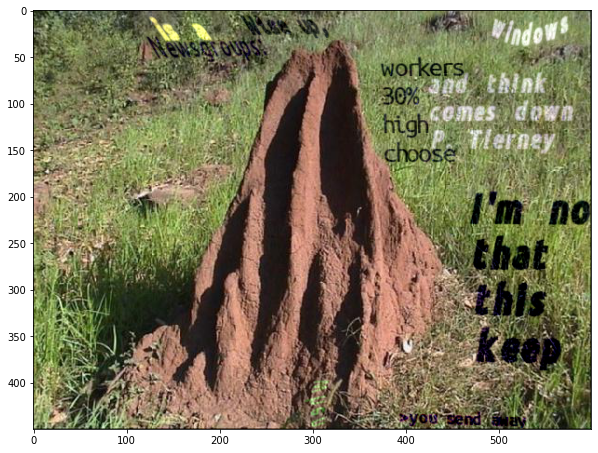

In [57]:
plt.figure(figsize=(10,10))
plt.imshow(h5["data"]["ant+hill_111.jpg_0"][:])

# Other examples

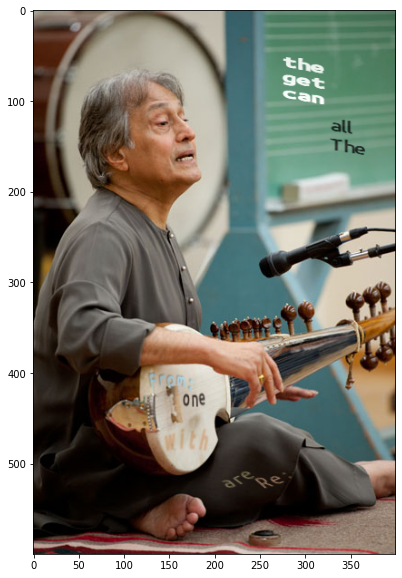

In [76]:
plt.figure(figsize=(10,10))
plt.imshow(h5["data"]["indian+musicians_116.jpg_0"][:])

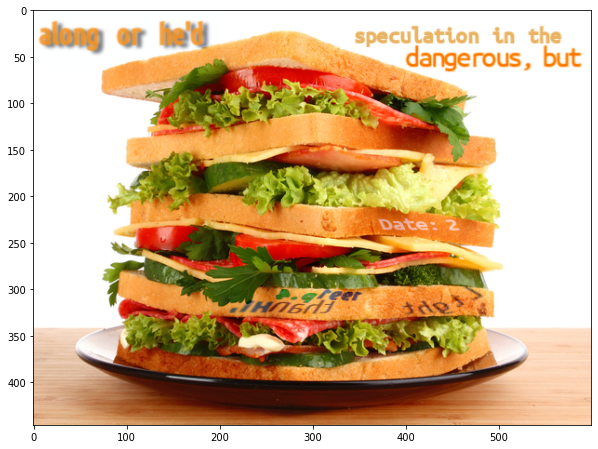

In [77]:
plt.figure(figsize=(10,10))
plt.imshow(h5["data"]["sandwich_96.jpg_0"][:])

In [78]:
h5["data"]["sandwich_96.jpg_0"].attrs["txt"]

array(['Date: 2', 'than', "along or he'd", 'p.4', '1991',
       'speculation in the', 'Hi,', 'Light', 'dangerous, but'],
      dtype=object)

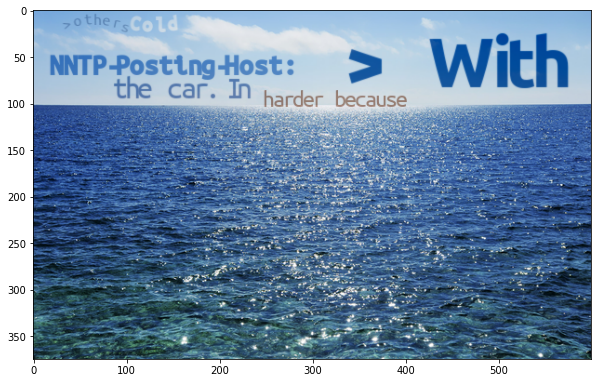

In [79]:
plt.figure(figsize=(10,10))
plt.imshow(h5["data"]["sea_15.jpg_0"][:])

In [80]:
h5["data"]["sea_15.jpg_0"].attrs["txt"]

array(['> With', 'Cold', 'the car. In', '>others', 'NNTP-Posting-Host:',
       'harder because'], dtype=object)

In [85]:
h5["data"]["sea_15.jpg_0"].attrs["wordBB"][:,:,0]

array([[339.00827 , 375.00693 , 375.0004  , 339.00174 ],
       [ 42.028503,  42.03486 ,  79.01575 ,  79.00939 ]], dtype=float32)